# Прогнозирование временных данных и случайных процессов

#### Оценка риск-факторов и построение симуляций




### Постановка задачи:

Составляющие: симуляционная модель для риск-факторов (учитывающая корреляции, которые вы оцениваете самостоятельно), 3 прайсера для деривативов, сам расчёт квантильный метрики.

### План и мат. аппарат:


Модели считаются по следующим формулам:
- процентные (короткие) ставки RUB, USD:
$$dr_t = [\theta(t)-\alpha r_t]dt + \sigma_r dW_t$$
- FX_RUB/USD:
$$\frac{dX_t}{X_t} = k(\theta-\ln X_t)d_t + \sigma _{FX}(t)dW_t$$

Здесь $k \equiv Lambda$, $\sigma \equiv sigma = const$, $\theta$ из кривой.
Делаем замену переменных $Y_t = \ln X_t$ и симулируем $d Y_t = k(\theta-Y_t)dt + \sigma dW_t$ по схеме Эйлера-Маруямы.

Шаги:

1) Вычислить матрицу корреляций **приращений** размера 3x3: $\sigma = corr(\text{diff(RUB), diff(USD), diff(}\ln\text{(FX)}))$

2) Для каждой симуляции из N_sim (реализации Вселенной) строим тройку скоррелированных приращений.

Для этого сначала строим случайный нормальный вектор размера 3 $\times$ N_steps: $(N_1, N_2, N_3) \sim N(0, \sigma \cdot I)$.
Из него домножением на $C$ из разложения Холецкого получим вектор $(
\tilde N_1, \tilde N_2, \tilde N_3) \sim N(0, \sigma^2 \cdot I)$

3.1) Калибровка $\theta$:
$$\theta = F_t(0, t) + \alpha F(0, t) + \frac{\sigma^2}{2\alpha}(\alpha-e^{-2 \alpha t}),$$
где $F$ - кривая mean_reversion_level, а $F_t$ - численная производная.

3.2) Для каждого шага симуляции для момента t симулируем 3 вектора для каждого риск-фактора по своей модели.

4) Требуется оценить max скачок - считается 95-й квантиль по 2-хнедельным приращениям.

In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import scipy.interpolate
import scipy.misc
%matplotlib inline
import datetime

**Исходные данные**

Выбор ставки по деривативам, выраженных в рублях, пал на трехмесячный MosPrime Rate.

Во-первых, эта ставка наиболее широко используется для ценообразования деривативов, в частности, свопов. На середину 2019 года как минимум 64% свопов, у которых базовые активы выражены в рублях, были привязаны к ставке MosPrime.

Источник: https://econs.online/en/articles/finance/benchmark-interest-rate-reform-in-russia/

Во-вторых, MosPrime Rate по своей структуре напоминает LIBOR. Как и LIBOR - это индикативная ставка межбанковских кредитов, высчитываемая на основе данных, предоставляемых крупными банками. К тому же они имеют схожую структуру по срокам, в отличие от RUONIA (overnight).

В-третьих, трехмесячный MosPrime универсален. Он может использоваться для ценообразования как краткосрочных, так и долгосрочных ценных бумаг. Более краткосрочные ставки обладают более высокой волатильностью и не подходят для ценообразования долгосрочных ценных бумаг. 

Изначально предполагалось произвести ценообразование трех производных финансовых инструментов, дата экспирации которых от года и более. Такие сроки не могут быть классифицированы как краткосрочные.

Ну и последнее, MosPrime Rate соответствует Принципам финансового индикатора Международной организации комиссий по ценным бумагам IOSCO.

Соответственно, в пару к MosPrime Rate выбран LIBOR USD. Только пятая часть рынка кредитов чувствительна к изменения ставки LIBOR. Однако основная часть российского рынка свопов (объем рынка свопов - 8.9 трлн. руб) - долларовые свопы, используемые для хеджирования колебаний LIBOR.

**Выбор временного интервала для вычисления корреляции**

<u>**По условию все сделки заключены 1 января 2019 года.**</u>

<u>Отсчет ставок ведется от 1 января 2016 года.</u>

16 декабря 2015 года после затяжного периода нулевых ставок ФРС впервые с 2008 года изменила ставку, повысив ее до 0,25-0,5%. Далее вплоть до 2019 года наблюдалось только её повышение. Наша команда рассматривает это изменение, как структурное. Если сопоставлять с Россией, то валютный кризис 2014-15 годов также является своеобразным водоразделом. Преодолев кризисные испытания, Россия вышла на следующий этап перехода от развивающейся экономики к экономике развитого типа. Объединять кризисный период с тем, что сложилось после, было бы некорректно, тем более рассматривать данные в разрыве. Более того, максимальный тенор предлагаемого для ценообразования производного инструмента - 3.5 года, что сопоставимо со сроком между 1 января 2016 года и датой сделки.

**Подготовка данных для расчета корреляций разниц риск-факторов**

In [ ]:
Mosprime = pd.read_excel('2016-01-01_2019-12-31.xlsx')
Mosprime.columns = Mosprime.iloc[0]
Mosprime = Mosprime.drop(Mosprime.index[0])
Mosprime = Mosprime.dropna(axis='columns')
Mosprime3M = pd.DataFrame()
Mosprime3M['rate_date'] = Mosprime['Дата ставки']
Mosprime3M['rate_date'] = pd.to_datetime(Mosprime3M['rate_date']).dt.floor('d')
Mosprime3M['Mosprime3M'] = Mosprime['3M']/100
Mosprime3M_2019 = Mosprime3M[Mosprime3M.rate_date >= pd.Timestamp(2019, 1, 1)][::-1]  # test_batch
Mosprime3M = Mosprime3M[Mosprime3M.rate_date <= pd.Timestamp(2019, 1, 1)]
Mosprime3M.tail()

,rate_date,Mosprime3M
984,2016-01-15,0.1188
985,2016-01-14,0.1188
986,2016-01-13,0.1186
987,2016-01-12,0.1181
988,2016-01-11,0.118


In [ ]:
LIBOR_USD = pd.read_excel('USD3MTD156N.xls')
LIBOR_USD = LIBOR_USD.dropna()
LIBOR_USD['observation_date'] = pd.to_datetime(LIBOR_USD['observation_date']).dt.floor('d')
LIBOR_USD = LIBOR_USD.reindex(index=LIBOR_USD.index[::-1])
LIBOR_USD = LIBOR_USD.reset_index(drop = True)
LIBOR_USD = LIBOR_USD.rename(columns={'USD3MTD156N': 'LIBORUSD3M'})
LIBOR_USD['LIBORUSD3M'] = LIBOR_USD['LIBORUSD3M']/100 
LIBOR_USD_2019 = LIBOR_USD[LIBOR_USD.observation_date >= pd.Timestamp(2018, 12, 31)][::-1] # test_batch
LIBOR_USD = LIBOR_USD[LIBOR_USD.observation_date <= pd.Timestamp(2019, 1, 1)]

LIBOR_USD.tail()

,observation_date,LIBORUSD3M
1006,2016-01-08,0.006211
1007,2016-01-07,0.006169
1008,2016-01-06,0.006201
1009,2016-01-05,0.006171
1010,2016-01-04,0.006117


In [ ]:
LIBOR_USD.head()

,observation_date,LIBORUSD3M
253,2018-12-31,0.028076
254,2018-12-28,0.027970
255,2018-12-27,0.028030
256,2018-12-24,0.028134
257,2018-12-21,0.028216


In [ ]:
FExR = pd.read_csv('Rtsudcur.csv', sep = ';')
FExR = FExR.rename(columns={'rubusd': 'RUBperUSD'})
FExR['Date'] = pd.to_datetime(FExR['Date']).dt.floor('d')
FExR_2019 = FExR[FExR.Date >= pd.Timestamp(2018, 12, 29)][::-1]  # test data, 29.12 - последний день торгов в 2018
FExR = FExR[FExR.Date <= pd.Timestamp(2019, 1, 1)]

FExR.tail()

,Date,RUBperUSD
1005,2016-12-01,76.5756
1006,2016-11-01,75.8013
1007,2016-06-01,74.7748
1008,2016-05-01,73.4283
1009,2016-04-01,72.9320


In [ ]:
merged_inner = pd.merge(left=Mosprime3M,right=LIBOR_USD, left_on='rate_date', right_on='observation_date')
merged_inner = pd.merge(left=merged_inner,right=FExR, left_on='rate_date', right_on='Date')
merged_inner = merged_inner.drop(columns = ['observation_date', 'Date'])
# Логарифмирование, т.к. потом будет замена переменной
merged_inner['lnRUBperUSD'] = np.log(merged_inner['RUBperUSD'])
merged_inner['dMosprime3M'] = merged_inner['Mosprime3M'] - merged_inner['Mosprime3M'].shift(-1)
merged_inner['dLIBORUSD3M'] = merged_inner['LIBORUSD3M'] - merged_inner['LIBORUSD3M'].shift(-1)
merged_inner['dlnRUBperUSD'] = merged_inner['lnRUBperUSD'] - merged_inner['lnRUBperUSD'].shift(-1)
merged_inner.tail()

,rate_date,Mosprime3M,LIBORUSD3M,RUBperUSD,lnRUBperUSD,dMosprime3M,dLIBORUSD3M,dlnRUBperUSD
621,2016-01-15,0.1188,0.006196,77.6122,4.351725,0,-0.000015,0.015704
622,2016-01-14,0.1188,0.006211,76.4029,4.336021,0.0002,-0.000009,-0.001239
623,2016-01-13,0.1186,0.006220,76.4976,4.337259,0.0005,-0.000016,0.181246
624,2016-01-12,0.1181,0.006236,63.8166,4.156013,0.0001,0.000015,0.011004
625,2016-01-11,0.118,0.006221,63.1182,4.145009,NaN,NaN,NaN


In [ ]:
merged_inner.head()

,rate_date,Mosprime3M,LIBORUSD3M,RUBperUSD,lnRUBperUSD,dMosprime3M,dLIBORUSD3M,dlnRUBperUSD
0,2018-12-28,0.0859,0.027970,69.6895,4.244050,-0.0006,-0.000060,0.004134
1,2018-12-27,0.0865,0.028030,69.4020,4.239916,0.0004,-0.000104,0.015056
2,2018-12-24,0.0861,0.028134,68.3649,4.224860,0,-0.000082,-0.004068
3,2018-12-21,0.0861,0.028216,68.6436,4.228928,-0.0002,-0.000021,0.003402
4,2018-12-20,0.0863,0.028237,68.4105,4.225526,0,0.000341,0.012384


In [ ]:
merged_inner.columns

Index(['rate_date', 'Mosprime3M', 'LIBORUSD3M', 'RUBperUSD', 'lnRUBperUSD',
       'dMosprime3M', 'dLIBORUSD3M', 'dlnRUBperUSD'],
      dtype='object')

**Матрица корреляций разниц риск-факторов**

In [ ]:
set_corr = merged_inner.drop(columns = ['rate_date', 'Mosprime3M', 'LIBORUSD3M', 'RUBperUSD', 'lnRUBperUSD'])
set_corr.dropna(inplace = True)

corr = np.corrcoef([set_corr['dMosprime3M'].astype(float),
                  set_corr['dLIBORUSD3M'].astype(float),
                  set_corr['dlnRUBperUSD'].astype(float)])
corr

array([[ 1.        , -0.01731513,  0.07816374],
       [-0.01731513,  1.        , -0.03021785],
       [ 0.07816374, -0.03021785,  1.        ]])

**Визуализация распределения разниц риск-факторов по времени**

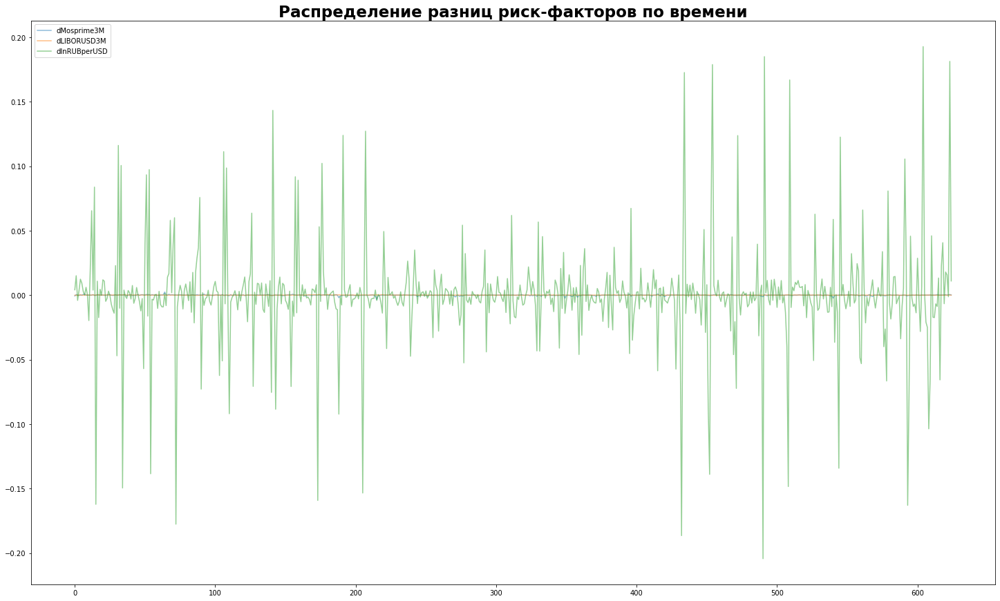

In [ ]:
plt.figure(figsize=(25,15))
plt.plot(set_corr['dMosprime3M'], label='dMosprime3M', alpha=0.5)
plt.plot(set_corr['dLIBORUSD3M'], label='dLIBORUSD3M', alpha=0.5)
plt.plot(set_corr['dlnRUBperUSD'], label='dlnRUBperUSD', alpha=0.5)
plt.legend()
plt.title('Распределение разниц риск-факторов по времени', fontweight="bold", fontsize = 23)
plt.show()

**Проверка матрицы на положительную определенность**

In [ ]:
def is_pos_def(x): 
    return np.all(np.linalg.eigvals(x) > 0)
is_pos_def(corr)

True

Корреляция есть, хоть и небольшая

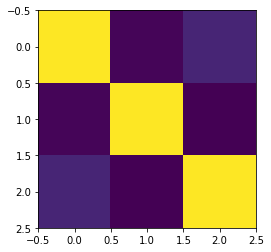

In [ ]:
plt.imshow(corr, interpolation="nearest")

**Разложение матрицы корреляций изменений по Холецкому**

In [ ]:
Cholesky = np.linalg.cholesky(corr)
Cholesky

array([[ 1.        ,  0.        ,  0.        ],
       [-0.01731513,  0.99985008,  0.        ],
       [ 0.07816374, -0.02886876,  0.99652247]])

****Подготовка данных для расчета $\theta$****

In [ ]:
rub_f = pd.read_excel('RUB IRS curve.xlsx', skiprows=1).set_index('Maturity')
usd_f = pd.read_excel('USD FRA curve.xlsx', skiprows=1).set_index('Maturity')

alpha_rub = 0.03
sigma_rub = 0.03

alpha_usd = 0.02
sigma_usd = 0.0093

Lambda = 0.015
sigma_fx = 0.11

In [ ]:
usd_f['ds.rate'] = usd_f['ds.rate']/100
usd_f.head()

,ds.rate
Maturity,
3M,0.028425
3m-6m,0.028078
6m-9m,0.027948
9m-12m,0.027867
12m-15m,0.027815


In [ ]:
rub_f['ds.rate'] = rub_f['ds.rate']/100
rub_f.head()

,ds.rate
Maturity,
3M,0.085199
3m-6m,0.086861
6m-9m,0.089046
9m-12m,0.090494
2Y,0.091662


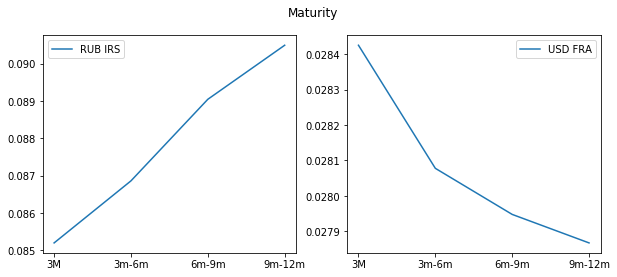

In [ ]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.plot(rub_f['3M':'9m-12m'], label='RUB IRS')
ax2.plot(usd_f['3M':'9m-12m'], label='USD FRA')
ax1.legend()
ax2.legend()
plt.suptitle('Maturity')
None
# rub_f['3M':'9m-12m'].plot()

# Вычисляем $\theta$
Интерполяция кривой до двухнедельных интервалов + модель
$$\theta = F_t(0, t) + \alpha F(0, t) + \frac{\sigma^2}{2\alpha}(1-e^{-2 \alpha t}),$$
где $F$ - наша кривая, а $F_t$ - численная производная

## Моделируем таймлайн
В году получается 26 двухнедельных интервалов

In [ ]:
start_date = datetime.datetime(day=1, month=1, year=2019)
start_date

datetime.datetime(2019, 1, 1, 0, 0)

In [ ]:
t = start_date
for x in range(27):
    t += datetime.timedelta(weeks=2)
    print(start_date + x * datetime.timedelta(weeks=2))

2019-01-01 00:00:00
2019-01-15 00:00:00
2019-01-29 00:00:00
2019-02-12 00:00:00
2019-02-26 00:00:00
2019-03-12 00:00:00
2019-03-26 00:00:00
2019-04-09 00:00:00
2019-04-23 00:00:00
2019-05-07 00:00:00
2019-05-21 00:00:00
2019-06-04 00:00:00
2019-06-18 00:00:00
2019-07-02 00:00:00
2019-07-16 00:00:00
2019-07-30 00:00:00
2019-08-13 00:00:00
2019-08-27 00:00:00
2019-09-10 00:00:00
2019-09-24 00:00:00
2019-10-08 00:00:00
2019-10-22 00:00:00
2019-11-05 00:00:00
2019-11-19 00:00:00
2019-12-03 00:00:00
2019-12-17 00:00:00
2019-12-31 00:00:00


Рассчитаем, как будут соотноситься точки на кривой в месяцах и двухнедельные интервалы - приведем к общему знаменателю - ко дням от даты заключения сделки

In [ ]:
def day_n(x):
    return (x-start_date).days

In [ ]:
# Реперные точки кривой (12 месяцев):
curve_dates_lst = [
    datetime.datetime(day=1, month=4, year=2019),
    datetime.datetime(day=1, month=7, year=2019),
    datetime.datetime(day=1, month=10, year=2019),
    datetime.datetime(day=1, month=1, year=2020)
]
curve_points = [day_n(d) for d in curve_dates_lst]
curve_points

[90, 181, 273, 365]

In [ ]:
# Функция от дня n со дня заключения сделки
F_rub = scipy.interpolate.CubicSpline(curve_points, rub_f['3M':'9m-12m']['ds.rate'], 
                                    extrapolate=True, bc_type='natural')
F_usd = scipy.interpolate.CubicSpline(curve_points, usd_f['3M':'9m-12m']['ds.rate'], 
                                    extrapolate=True, bc_type='natural')
F_rub_t = lambda x: scipy.misc.derivative(F_rub, x)
F_usd_t = lambda x: scipy.misc.derivative(F_usd, x)

In [ ]:
rub_f

,ds.rate
Maturity,
3M,0.085199
3m-6m,0.086861
6m-9m,0.089046
9m-12m,0.090494
2Y,0.091662
3Y,0.091628
4Y,0.091191
5Y,0.090626
6Y,0.090102


Точки для двухнедельного таймлайна:

In [ ]:
timeline = [14*i for i in range(27)]
print(timeline)

[0, 14, 28, 42, 56, 70, 84, 98, 112, 126, 140, 154, 168, 182, 196, 210, 224, 238, 252, 266, 280, 294, 308, 322, 336, 350, 364]


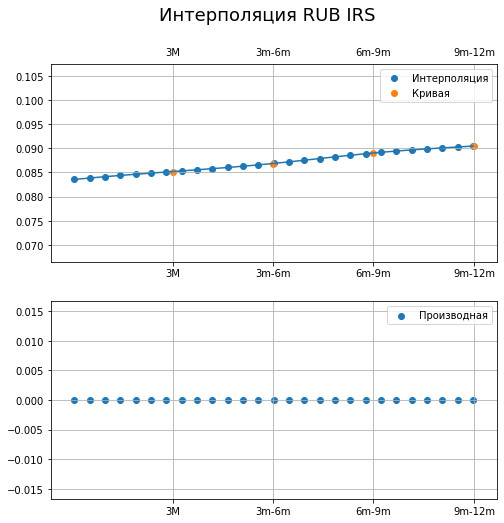

In [ ]:
# Domestic
source = rub_f['3M':'9m-12m']['ds.rate']
F = F_rub
F_t = F_usd_t

figure, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(8,8))

ax1.set_xticks(curve_points)
ax1.set_xticklabels(usd_f['3M':'9m-12m'].index.tolist(), visible=True)

ax1.scatter(timeline, [F(t) for t in timeline], label='Интерполяция')
ax1.plot(timeline, [F(t) for t in timeline])
ax1.scatter(curve_points, source, label='Кривая')

ax1.legend()
ax2.scatter(timeline, [F_t(t) for t in timeline], label='Производная')
ax2.legend()

ax1.grid()
ax2.grid()
figure.suptitle('Интерполяция RUB IRS', fontsize = 18)
plt.show()

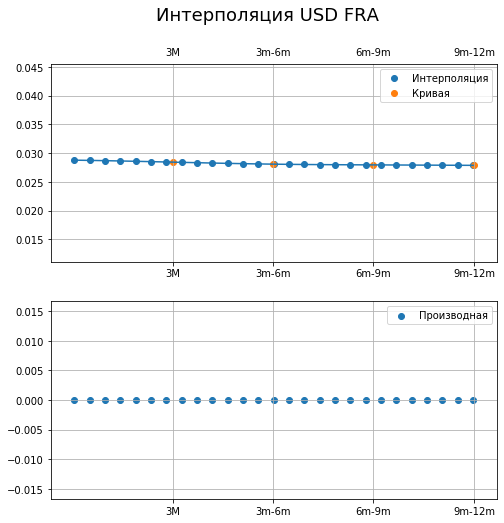

In [ ]:
# Foreign
source = usd_f['3M':'9m-12m']['ds.rate']
F = F_usd
F_t = F_usd_t

figure, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(8,8))

ax1.set_xticks(curve_points)
ax1.set_xticklabels(usd_f['3M':'9m-12m'].index.tolist(), visible=True)

ax1.scatter(timeline, [F(t) for t in timeline], label='Интерполяция')
ax1.plot(timeline, [F(t) for t in timeline])
ax1.scatter(curve_points, source, label='Кривая')

ax1.legend()
ax2.scatter(timeline, [F_t(t) for t in timeline], label='Производная')
ax2.legend()
# ax1.set_xticklabels(timeline, visible=True)

ax1.grid()
ax2.grid()
figure.suptitle('Интерполяция USD FRA', fontsize = 18)
plt.show()

## Моделируем $\theta$
$$\theta = F_t(0, t) + \alpha F(0, t) + \frac{\sigma^2}{2\alpha}(1-e^{-2 \alpha t})$$

In [ ]:
def theta(t, F, F_t, alpha, sigma):
    return F_t(t) + alpha*F(t) + (sigma**2) * (1 - np.exp(-2*alpha*t)) / (2*alpha)

In [ ]:
theta_rub = lambda x: theta(x, F_rub, F_rub_t, alpha_rub, sigma_rub)
theta_usd = lambda x: theta(x, F_usd, F_usd_t, alpha_usd, sigma_usd)

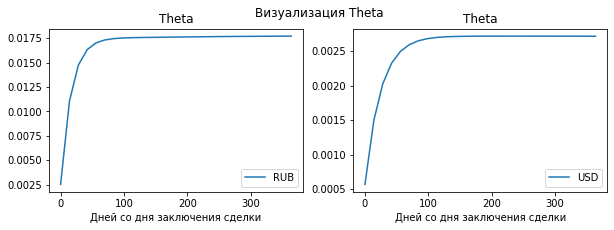

In [ ]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))
ax1.plot(timeline, [theta_rub(t) for t in timeline], label='RUB')
# plt.plot(timeline, [theta_usd(t) for t in timeline], label='USD')
ax1.set_xlabel('Дней со дня заключения сделки')
ax1.legend()
ax1.set_title('Theta')

ax2.plot(timeline, [theta_usd(t) for t in timeline], label='USD')
ax2.set_xlabel('Дней со дня заключения сделки')
ax2.legend()
ax2.set_title('Theta')
_.suptitle('Визуализация Theta')
plt.show()

# Симуляция: функция от количества насимулированных траекторий n_sim

In [ ]:
Cholesky

array([[ 1.        ,  0.        ,  0.        ],
       [-0.01731513,  0.99985008,  0.        ],
       [ 0.07816374, -0.02886876,  0.99652247]])

In [ ]:
from scipy.stats import norm

def gen_dW(C, n_steps, dt):
    """Симуляция 3-х скоррелированных с.в. длины n_steps"""
    n_factors = C.shape[0]
    dW = np.sqrt(dt) * np.random.normal(size=(n_factors, n_steps))  # iid
    dW = np.dot(C, dW)  # correlated id
    return dW

### Схема Эйлера-Маруямы:
    
СДУ:
    $$dX_t = b(t, X_t)dt + \sigma(t, X_t)dW_t$$
Тогда численная аппроксимация имеет вид:
    $$X_{i} = X_{i-1} + b(t_{i-1}, X_{i-1}) \Delta t + \sigma(W_{t}-W_{t-1})$$
    
(У нас сигмы константные)
### Hull-White:
$$dr_t = [\theta(t)-\alpha r_t]dt + \sigma_r dW_t$$
$$b(t, r_t) \equiv [\theta(t)-\alpha r_t]$$
$$r_{i} = r_{i-1} + [\theta_{i-1}-\alpha r_{i-1}] \Delta t + \sigma(W_{t}-W_{t-1})$$

### Модель Халла для валютного курса:
$$\frac{dX_t}{X_t} = k(\theta-\ln X_t)d_t + \sigma _{FX}(t)dW_t$$
$$Y_t = \ln X_t $$
$$dY_t = k(\theta-Y_t)d_t + \sigma _{FX}(t)dW_t$$
$$b(t, Y_t) \equiv k(\theta_{t}-Y_{t})$$
$$Y_{i} = Y_{i-1} + k(\theta_{i-1}-Y_{i-1}) \Delta t + \sigma(W_{t}-W_{t-1})$$


In [ ]:
def hull_trajectories(k, sigma, r_0, timeline, dt, dW):
    """Моделируем траекторию для одной реализации мира"""
    n_steps = len(timeline)
    r = [None] * n_steps
    r[0] = np.log(r_0)
    for i in range(1, n_steps):
        r[i] = r[i-1] + k*(r[0]*(1+F_rub(timeline[i-1])/100)/(1+F_usd(timeline[i-1])/100) - r[i-1])*dt + sigma*dW[i-1]
    return np.exp(np.array(r))

In [ ]:
def hull_white_trajectories(alpha, theta, sigma, r_0, timeline, dt, dW):
    """Моделируем траекторию для одной реализации мира"""
    n_steps = len(timeline)
    r = [None] * n_steps
    r[0] = r_0
    for i in range(1, n_steps):
        r[i] = r[i-1] + (theta(timeline[i-1]) - alpha*r[i-1])*dt + sigma*dW[i-1]
    return r

In [ ]:
def modeling_with_early_stopping(eps, steps_for_check=10, tries_default = 20): 
    '''
    Моделируем с используем критерия ранней остановки
    tries -- для устойчивости критерия ранней остановки необходимо, 
    чтобы мы не превышали eps tries раз подряд
    '''
    rub_trajects = []
    dol_trajects = []
    fx_trajects = []
    max_95_perc = 1
    i = 0
    s = 0
    
    tries = tries_default #для устойчивости будем проверять, что мы не выходим за epsilon tries шагов подряд
    
    while True:
        i += 1
#         Симуляция траектории для данной версии мира
        dWs = gen_dW(Cholesky, len(timeline), 14/365)
        
        rub_trajects.append(hull_white_trajectories(alpha_rub, theta_rub, sigma_rub, Mosprime3M.iloc[0, 1], 
                                             timeline, 14/365, dWs[0]))
        dol_trajects.append(hull_white_trajectories(alpha_usd, theta_usd, sigma_usd, LIBOR_USD.iloc[0, 1], 
                                             timeline, 14/365, dWs[1]))
        fx_trajects.append(hull_trajectories(Lambda, sigma_fx, merged_inner.iloc[0, 3], 
                                             timeline, 14/365, dWs[2]))
        if (i % steps_for_check == 0):
            arr_for_search_max_perc95 = fx_trajects.copy()
            arr_for_search_max_perc95.extend(rub_trajects)
            arr_for_search_max_perc95.extend(dol_trajects)
#             Считаем 95-й квантиль приращений по всем симуляциям для данной даты
            p95_max_curr = np.abs(pd.DataFrame(arr_for_search_max_perc95).diff(axis=1).iloc[:, 1:]).quantile(0.95).max()
            cur_eps =  np.abs(max_95_perc - p95_max_curr)
            s += 1
            # Критерий останова: разность максимальных квантилей при добавлении новой симуляции меньше эпсилон
            if cur_eps < eps:  
                if tries == 1:
                    print(f'Критерий ранней остановки отработал через {s * steps_for_check} итераций')
                    df_rub = pd.DataFrame(rub_trajects)
                    df_usd = pd.DataFrame(dol_trajects)
                    df_fx = pd.DataFrame(fx_trajects)

                    df_rub_mean = df_rub.mean()
                    df_usd_mean = df_usd.mean()
                    df_fx_mean = df_fx.mean()

                    df_rub_5p = df_rub.quantile(0.05)
                    df_usd_5p = df_usd.quantile(0.05)
                    df_fx_5p = df_fx.quantile(0.05)

                    df_rub_95p = df_rub.quantile(0.95)
                    df_usd_95p = df_usd.quantile(0.95)
                    df_fx_95p = df_fx.quantile(0.95)

                    percentiles = {}
                    percentiles['rub'] = np.abs(pd.DataFrame(rub_trajects).diff(axis=1).iloc[:, 1:]).quantile(0.95).max()
                    percentiles['usd'] = np.abs(pd.DataFrame(dol_trajects).diff(axis=1).iloc[:, 1:]).quantile(0.95).max()
                    percentiles['fx'] = np.abs(pd.DataFrame(fx_trajects).diff(axis=1).iloc[:, 1:]).quantile(0.95).max()
                    print('95 квантили:', percentiles)

                    return (s-1) * steps_for_check, rub_trajects, dol_trajects, fx_trajects,\
                           df_rub_mean, df_usd_mean, df_fx_mean, \
                           df_rub_5p, df_usd_5p, df_fx_5p, \
                           df_rub_95p, df_usd_95p, df_fx_95p, percentiles
                if tries > 1:
                    tries -= 1
                if cur_eps > eps:
                    tries = tries_default
                    
            rub_trajects, dol_trajects, fx_trajects
            max_95_perc = p95_max_curr

In [ ]:
res = modeling_with_early_stopping(1e-4)

Критерий ранней остановки отработал через 3520 итераций
95 квантили: {'rub': 0.011942021289122268, 'usd': 0.0036879097324612076, 'fx': 3.0768536420658696}


Убедимся в устойчивости ранней остановки:

In [ ]:
res = modeling_with_early_stopping(1e-4)

Критерий ранней остановки отработал через 6810 итераций
95 квантили: {'rub': 0.011790857319307277, 'usd': 0.0036499683738917704, 'fx': 3.0478420938031103}


In [ ]:
res = modeling_with_early_stopping(1e-4)

Критерий ранней остановки отработал через 4970 итераций
95 квантили: {'rub': 0.011870609948119844, 'usd': 0.0036542288278202406, 'fx': 3.0372383397082854}


In [ ]:
res = modeling_with_early_stopping(1e-4)

Критерий ранней остановки отработал через 6240 итераций
95 квантили: {'rub': 0.01178176272568899, 'usd': 0.0036826645550659216, 'fx': 2.990870878287616}


In [ ]:
FExR_2019.head()

,Date,RUBperUSD
252,2018-12-29,69.8395
251,2019-03-01,68.8594
250,2019-04-01,67.8064
249,2019-08-01,67.0412
248,2019-09-01,66.9748


In [ ]:
def plot_all(n_sim, rub_trajects, dol_trajects, fx_trajects,\
                       df_rub_mean, df_usd_mean, df_fx_mean, \
                       df_rub_5p, df_usd_5p, df_fx_5p, \
                       df_rub_95p, df_usd_95p, df_fx_95p, percentiles):
    
    fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(40, 80))
    
    for i in range(n_sim):
        ax[0].plot(rub_trajects[i], alpha=0.9, zorder=1)
        ax[1].plot(dol_trajects[i], alpha=0.9, zorder=1)
        ax[2].plot(fx_trajects[i], alpha=0.9, zorder=1)
        
        
    ax[0].set_title('Симуляция Mosprime3M, 95 перцентиль 2х-недельного скачка ставок = %.3f' % percentiles['rub'],
                    fontsize=35)
    ax[0].set_xlabel('Номер недели', fontsize=25)
    ax[0].tick_params(axis="x", labelsize=20)
    ax[0].tick_params(axis="y", labelsize=30)
    ax[0].plot(df_rub_mean, lw=5, color="black", label='Mean')
    ax[0].plot(df_rub_5p, lw=5, color="red", label='5 quantile')
    ax[0].plot(df_rub_95p, lw=5, color="blue", label='95 quantile')
    ax[0].plot(range(25), Mosprime3M_2019['Mosprime3M'][::10], lw=5, color="yellow", label='Real')
    ax[0].legend(prop={'size': 30})
    ax[0].grid(zorder=0, lw=2)

    ax[1].set_title('Симуляция LIBORUSD3M, 95 перцентиль 2х-недельного скачка ставок = %.3f' % percentiles['usd'], 
                    fontsize=35)
    ax[1].set_xlabel('Номер недели', fontsize=25)
    ax[1].tick_params(axis="x", labelsize=20)
    ax[1].tick_params(axis="y", labelsize=30)
    ax[1].plot(df_usd_mean, lw=5, color="black", label='Mean')
    ax[1].plot(df_usd_5p, lw=5, color="red", label='5 quantile')
    ax[1].plot(df_usd_95p, lw=5, color="blue", label='95 quantile')
    ax[1].plot(range(26), LIBOR_USD_2019['LIBORUSD3M'][::10], lw=5, color="yellow", label='Real')
    ax[1].legend(prop={'size': 30})
    ax[1].grid(zorder=0, lw=2)


    ax[2].set_title('Симуляция валютного курса RUB/USD, 95 перцентиль 2х-недельного скачка ставок = %.3f' % percentiles['fx'], fontsize=35)
    ax[2].set_xlabel('Номер недели', fontsize=25)
    
    ax[2].tick_params(axis="x", labelsize=20)
    ax[2].tick_params(axis="y", labelsize=30)
    ax[2].plot(df_fx_mean, lw=5, color="black", label='Mean')
    ax[2].plot(df_fx_5p, lw=5, color="red", label='5 quantile')
    ax[2].plot(df_fx_95p, lw=5, color="blue", label='95 quantile')
    ax[2].plot(range(26), FExR_2019['RUBperUSD'][::10], lw=5, color="yellow", label='Real')
    ax[2].legend(prop={'size': 30})
    ax[2].grid(zorder=0, lw=2)


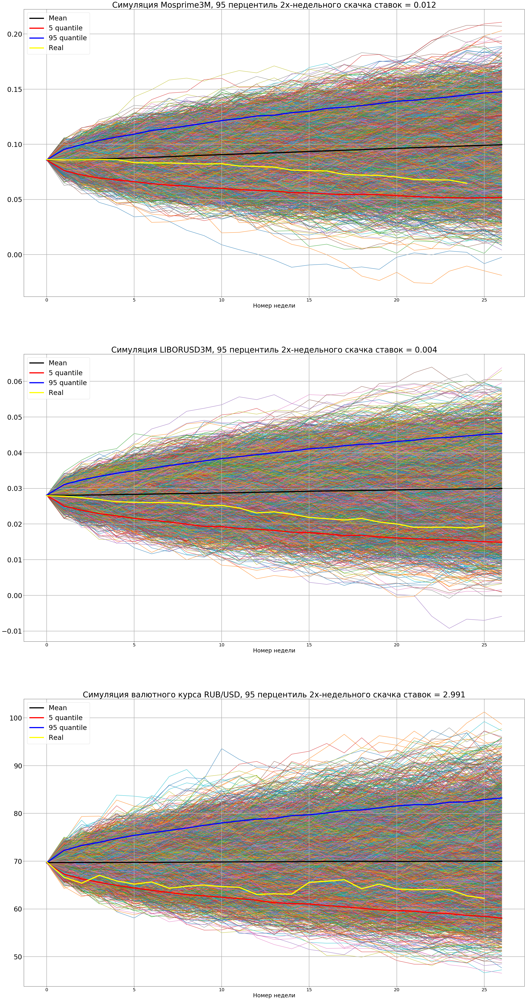

In [ ]:
plot_all(*res)

# Заключение:

Получены следующие результаты:
    
C 95% вероятностью 2-хнедельный скачок ставок не превысит:

- RUB: 0.012
- USD: 0.004
- RUB/USD: 3


При симуляции критерий останова: разность 95-х квантилей должны быть меньше 1e-4.


При симуляции данных процентных ставок для рубля и доллара реальные показатели попали в 95% доверительный интервал.

При симуляции курса RUB/USD произошел выход из доверительного интервала в 2 первых точках.